In [ ]:
!git clone https://github.com/siddhanttt2506/FOMM.git

Cloning into 'FOMM'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 48 (delta 5), reused 47 (delta 4), pack-reused 0 (from 0)
Receiving objects: 100% (48/48), 160.00 KiB | 12.31 MiB/s, done.
Resolving deltas: 100% (5/5), done.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd FOMM

/content/FOMM


In [ ]:
!pip install sync_batchnorm

In [ ]:
import matplotlib

matplotlib.use('Agg')

import os, sys
import yaml
from argparse import ArgumentParser
from time import gmtime, strftime
from shutil import copy

from frames_dataset import FramesDataset

from modules.generator import OcclusionAwareGenerator
from modules.discriminator import MultiScaleDiscriminator
from modules.keypoint_detector import KPDetector

import torch

from train import train
from reconstruction import reconstruction
from animate import animate

In [ ]:
# Load the configuration file
config_path = "/content/FOMM/config/vox-256.yaml"  # Replace with your config file path
with open(config_path) as f:
    config = yaml.load(f, Loader=yaml.FullLoader)
print("Config Loaded Successfully")


Config Loaded Successfully


In [ ]:
# Initialize Generator
generator = OcclusionAwareGenerator(**config['model_params']['generator_params'],
                                    **config['model_params']['common_params'])

# Initialize Discriminator
discriminator = MultiScaleDiscriminator(**config['model_params']['discriminator_params'],
                                        **config['model_params']['common_params'])

# Initialize Keypoint Detector
kp_detector = KPDetector(**config['model_params']['kp_detector_params'],
                         **config['model_params']['common_params'])

# Move models to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)
kp_detector.to(device)

print("Models Initialized Successfully")


/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Models Initialized Successfully


In [ ]:
# Load Dataset
dataset = FramesDataset(is_train=True, **config['dataset_params'])
print("Dataset Loaded Successfully")


Use predefined train-test split.
Dataset Loaded Successfully


In [ ]:
from frames_dataset import PairedDataset


In [ ]:
PairedDataset(**config['dataset_params'])

TypeError: PairedDataset.__init__() got an unexpected keyword argument 'root_dir'

In [ ]:
# Load checkpoint if available
checkpoint_path = None  # Replace with your checkpoint path if needed
if checkpoint_path:
    checkpoint = torch.load(checkpoint_path, map_location=device)
    generator.load_state_dict(checkpoint['generator'])
    discriminator.load_state_dict(checkpoint['discriminator'])
    kp_detector.load_state_dict(checkpoint['kp_detector'])
    print("Checkpoint Loaded Successfully")
else:
    print("No Checkpoint Provided. Starting Fresh.")


No Checkpoint Provided. Starting Fresh.


In [ ]:
import cv2

# Read the image
image = cv2.imread("/content/FOMM/dp.jpg")

# Resize the image to 256x256
resized_image = cv2.resize(image, (256, 256))

# Save or display the resized image
cv2.imwrite("/content/FOMM/resized_image.jpg", resized_image)


True

In [ ]:
from torchvision.transforms import ToTensor
from PIL import Image

# Test Keypoint Detection
test_image_path = "/content/FOMM/resized_image.jpg"  # Replace with a test image path

test_image = Image.open(test_image_path).convert('RGB')
test_tensor = ToTensor()(test_image).unsqueeze(0).to(device)

# Pass through Keypoint Detector
with torch.no_grad():
    keypoints = kp_detector(test_tensor)

print("Keypoints Detected Successfully")
print("Keypoints:", keypoints)


Keypoints Detected Successfully
Keypoints: {'value': tensor([[[ 0.1192,  0.4904],
         [-0.6404, -0.2649],
         [-0.1529,  0.5963],
         [-0.1365,  0.7989],
         [ 0.4002,  0.6624],
         [ 0.0331,  0.2948],
         [ 0.4063,  0.8664],
         [-0.2120,  0.7147],
         [-0.4057, -0.2629],
         [-0.1958, -0.3084]]], device='cuda:0'), 'jacobian': tensor([[[[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]],

         [[1.0000, 0.0000],
          [0.0000, 1.0000]]]], device='cuda:0')}


In [ ]:
!watch -n 1 nvidia-smi

In [ ]:

# Define log directory
log_dir = "/content/FOMM/log_directory"  # Replace with your log directory path
os.makedirs(log_dir, exist_ok=True)

# Train for one epoch (or full training)
train(config, generator, discriminator, kp_detector, checkpoint_path, log_dir, dataset, device_ids=[0])


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
  0%|          | 0/1 [00:00<?, ?it/s]WARNING:imageio_ffmpeg:We had to kill ffmpeg to stop it.


Error reading /content/drive/MyDrive/vox/train/id10257#Ko-rW5RWuOo#004136#004254.mp4: Could not load meta information
=== stderr ===

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwbenc --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libdav1d --enable-libxvi

Error reading /content/drive/MyDrive/vox/train/id10756#SCiUzeUrjR4#003754#003888.mp4: Could not load meta information
=== stderr ===

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwbenc --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libdav1d --enable-libxvi

Error reading /content/drive/MyDrive/vox/train/id10932#7X-HCBVaHrk#002419#002563.mp4: Could not load meta information
=== stderr ===

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwbenc --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libdav1d --enable-libxvi

Error reading /content/drive/MyDrive/vox/train/id10404#U7-8muCNt6g#004952#005079.mp4: Could not load meta information
=== stderr ===

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwbenc --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libdav1d --enable-libxvi

  0%|          | 0/1 [01:56<?, ?it/s]


TypeError: Caught TypeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/_utils/worker.py", line 351, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/_utils/fetch.py", line 52, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/_utils/fetch.py", line 52, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
  File "/content/FOMM/frames_dataset.py", line 159, in __getitem__
  File "/content/FOMM/frames_dataset.py", line 122, in __getitem__
    num_frames = len(frames)
                 ^^^^^^^^^^^^
TypeError: object of type 'NoneType' has no len()


In [ ]:
from augmentation import AllAugmentationTransform

In [ ]:
import os
import numpy as np
from imageio import imread, mimread
from skimage.color import gray2rgb
from skimage.util import img_as_float32
from google.colab.patches import cv2_imshow

def read_video(name, frame_shape):
    """
    Read video which can be:
      - a single image of concatenated frames
      - a '.mp4', '.gif', or '.mov' video file
      - a folder with image frames
    """
    try:
        if os.path.isdir(name):
            # Process folder of images
            frames = sorted(os.listdir(name))
            num_frames = len(frames)
            video_array = np.array(
                [img_as_float32(imread(os.path.join(name, frames[idx]))) for idx in range(num_frames)]
            )

        elif name.lower().endswith(('.png', '.jpg')):
            # Process single image
            image = imread(name)
            if len(image.shape) == 2 or image.shape[2] == 1:
                image = gray2rgb(image)
            if image.shape[2] == 4:
                image = image[..., :3]  # Remove alpha channel
            image = img_as_float32(image)
            video_array = np.moveaxis(image, 1, 0).reshape((-1,) + frame_shape)
            video_array = np.moveaxis(video_array, 1, 2)

        elif name.lower().endswith(('.gif', '.mp4', '.mov')):
            # Process video file
            video = np.array(mimread(name))
            if len(video.shape) == 3:  # Grayscale video
                video = np.array([gray2rgb(frame) for frame in video])
            if video.shape[-1] == 4:
                video = video[..., :3]  # Remove alpha channel
            video_array = img_as_float32(video)

        else:
            raise ValueError(f"Unknown file extension: {name}")

        return video_array

    except Exception as e:
        print(f"Error reading {name}: {e}")
        return None

# Define the file path
file_path = "/content/drive/MyDrive/vox/test/id10282#Zbz058o9j6s#004557#004656.mp4"

# Define the frame shape (height, width, channels)
frame_shape = (256, 256, 3)  # Example frame shape, adjust as needed

# Read the video
video_array = read_video(file_path, frame_shape)

# Check if the video was read successfully
if video_array is not None:
    print("Video read successfully!")
    print(f"Video shape: {video_array.shape}")
    print(video_array[0])
    for frame in video_array:
      frame = (frame*255).astype(np.uint8)
      cv2.imshow("Video", frame)
      key = cv2.waitKey(30)
      if key == 27:
        break
else:
    print("Failed to read the video.")

Video read successfully!
Video shape: (119, 256, 256, 3)
[[[0.         0.20000002 0.5058824 ]
  [0.         0.19607845 0.5019608 ]
  [0.         0.1764706  0.4901961 ]
  ...
  [0.44705886 0.11764707 0.14117648]
  [0.454902   0.11764707 0.1254902 ]
  [0.45882356 0.12156864 0.12941177]]

 [[0.         0.20000002 0.5058824 ]
  [0.         0.19607845 0.5019608 ]
  [0.         0.18431373 0.49803925]
  ...
  [0.44705886 0.11764707 0.14117648]
  [0.44705886 0.10980393 0.11764707]
  [0.44705886 0.10980393 0.11764707]]

 [[0.         0.20784315 0.5137255 ]
  [0.         0.20784315 0.5137255 ]
  [0.00784314 0.19607845 0.50980395]
  ...
  [0.44705886 0.12941177 0.14901961]
  [0.45882356 0.12156864 0.12941177]
  [0.45882356 0.12156864 0.12941177]]

 ...

 [[0.04313726 0.03921569 0.16862746]
  [0.04705883 0.04313726 0.17254902]
  [0.04705883 0.04313726 0.17254902]
  ...
  [0.41960788 0.12156864 0.07843138]
  [0.3529412  0.05490196 0.01176471]
  [0.31764707 0.01960784 0.        ]]

 [[0.04705883 0.0

DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


Video read successfully!
Video shape: (119, 256, 256, 3)


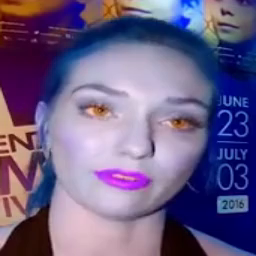

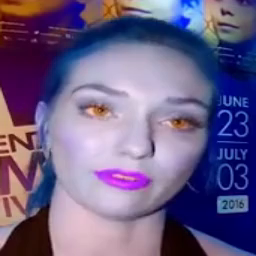

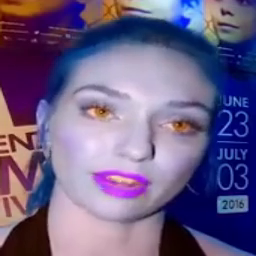

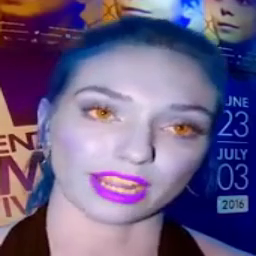

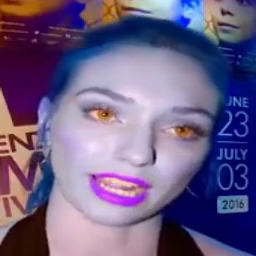

...

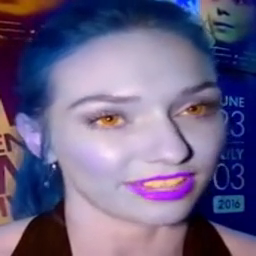

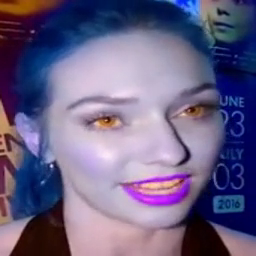

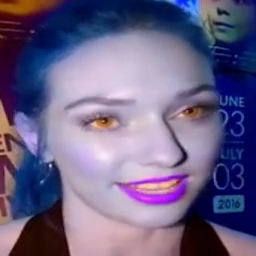

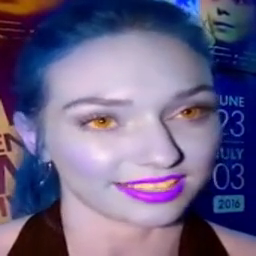

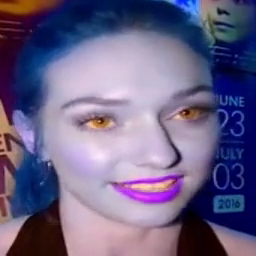

In [ ]:
import os
import numpy as np
from imageio import imread, mimread
from skimage.color import gray2rgb
from skimage.util import img_as_float32
from google.colab.patches import cv2_imshow  # Use cv2_imshow for Colab

def read_video(name, frame_shape):
    """
    Read video which can be:
      - a single image of concatenated frames
      - a '.mp4', '.gif', or '.mov' video file
      - a folder with image frames
    """
    try:
        if os.path.isdir(name):
            # Process folder of images
            frames = sorted(os.listdir(name))
            num_frames = len(frames)
            video_array = np.array(
                [img_as_float32(imread(os.path.join(name, frames[idx]))) for idx in range(num_frames)]
            )

        elif name.lower().endswith(('.png', '.jpg')):
            # Process single image
            image = imread(name)
            if len(image.shape) == 2 or image.shape[2] == 1:
                image = gray2rgb(image)
            if image.shape[2] == 4:
                image = image[..., :3]  # Remove alpha channel
            image = img_as_float32(image)
            video_array = np.moveaxis(image, 1, 0).reshape((-1,) + frame_shape)
            video_array = np.moveaxis(video_array, 1, 2)

        elif name.lower().endswith(('.gif', '.mp4', '.mov')):
            # Process video file
            video = np.array(mimread(name))
            if len(video.shape) == 3:  # Grayscale video
                video = np.array([gray2rgb(frame) for frame in video])
            if video.shape[-1] == 4:
                video = video[..., :3]  # Remove alpha channel
            video_array = img_as_float32(video)

        else:
            raise ValueError(f"Unknown file extension: {name}")

        return video_array

    except Exception as e:
        print(f"Error reading {name}: {e}")
        return None

# Define the file path
file_path = "/content/drive/MyDrive/vox/test/id10282#Zbz058o9j6s#004557#004656.mp4"

# Define the frame shape (height, width, channels)
frame_shape = (256, 256, 3)  # Example frame shape, adjust as needed

# Read the video
video_array = read_video(file_path, frame_shape)

# Check if the video was read successfully
if video_array is not None:
    print("Video read successfully!")
    print(f"Video shape: {video_array.shape}")

    # Display the first frame
    first_frame = (video_array[0] * 255).astype(np.uint8)
    cv2_imshow(first_frame)  # Use cv2_imshow instead of cv2.imshow

    # Display all frames in a loop
    for frame in video_array:
        frame = (frame * 255).astype(np.uint8)  # Convert to uint8 for display
        cv2_imshow(frame)  # Use cv2_imshow instead of cv2.imshow
else:
    print("Failed to read the video.")

In [ ]:
import matplotlib.pyplot as plt




In [ ]:
!pip install --upgrade imageio[ffmpeg]
!pip install imageio[ffmpeg]
!pip install imageio[pyav]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 63.9 MB/s eta 0:00:00


In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3"
!python run.py --config /content/FOMM/config/vox-256.yaml --device_ids 0 --mode train

Streaming output truncated to the last 5000 lines.

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwbenc --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libdav1d --enable-libxvid --enable-libzvbi --enable-libzimg
  libavutil      56. 31.100 / 56. 31.100
  lib

In [ ]:
import torch
torch.cuda.empty_cache()  # Clears the unused GPU memory
torch.cuda.memory_summary(device=None, abbreviated=False)/content/FOMM/log/vox-256

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |    943 MiB |  24522 MiB | 716684 MiB | 715741 MiB |\n|       from large pool |    930 MiB |  24509 MiB | 716454 MiB | 715524 MiB |\n|       from small pool |     12 MiB |     17 MiB |    229 MiB |    217 MiB |\n|---------------------------------------------------------------------------|\n| Active memory         |    943 MiB |  24522 MiB | 716684 MiB | 715741 MiB |\n|       from large pool |    930 MiB |  24509 MiB |

In [ ]:
import tensorflow as tf
tf.keras.backend.clear_session()  # Clears session and releases memory


In [ ]:
from imageio import mimread

def read_video(name, frame_shape=None):
    try:
        video = mimread(name)
        if frame_shape:
            video = [frame.resize(frame_shape) for frame in video]
        return np.array(video)
    except Exception as e:
        print(f"Error reading video {name}: {e}")
        return None  # or handle appropriately

In [ ]:
path = "/content/drive/MyDrive/vox/test/id10281#dX8RBKI2FKc#002838#003031.mp4"

In [ ]:
!ffmpeg -i path


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab